# Denoise Smartphone Image Noises From the "Smartphone Image Denoising Dataset (SIDD)"

### **NOTE1: ** Due to the size of the dataset, the model is trained locally on a MacBook Pro 16 M3 Max with Tensorflow-Metal environment. We are unable to submit the .npy array or the images used as they are too big (many gigabytes large). However, we have all the outputs saved in this .ipynb for grading, and also we have provided history logs during training in text files.

Justin Cui, Ayleen Farnood, Junhao (Harry) Wang

In [3]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# from tqdm import tqdm

### **NOTE2: Skip to Step 4**, as Step 1-3 is preprocessing the images an data which requires the full datasets and take a long time. Step 4 utilitized the .npy files that were already preprocessed.

## Step 1: Loading in the Dataset from Images


## About the Dataset

1. The dataset is popularly known as **Smartphone Image Denoising Dataset (SIDD)**.
2. It contains 160 pairs of noisy/ground-truth images.
3. The images are of exceptionally high-quality and have been taken by different smartphones under different illuminations.

## Note
The following sections loads the images from the dataset to generate a .npy file
Once the .npy file is created we can save it and load it in


In [ ]:
with open('/content/drive/MyDrive/SIDD/SIDD_Small_sRGB/SIDD_Small_sRGB_Only/_ReadMe.txt') as f:
    readme = f.read()

print(readme)

In [ ]:
with open('/content/drive/MyDrive/SIDD/SIDD_Small_sRGB/SIDD_Small_sRGB_Only/Scene_Instances.txt') as f:
    instances = f.read()

instances = instances.split('\n')
instances[:5]

In [ ]:
path = '/content/drive/MyDrive/SIDD/SIDD_Small_sRGB/SIDD_Small_sRGB_Only/Data/'

noisy_images_path = []
gt_images_path = []

for f in instances:
    images_path = path + f + '/'

    for g in os.listdir(images_path):
        image_path = images_path + g

        if 'NOISY' in image_path:
            noisy_images_path.append(image_path)
        else:
            gt_images_path.append(image_path)


print('TOTAL NOISY IMAGES:', len(noisy_images_path))
print('TOTAL GROUND TRUTH IMAGES:', len(gt_images_path))

In [ ]:
for i in range(0,len(noisy_images_path),20):
    print(noisy_images_path[i])

In [ ]:
HEIGHT = []
WIDTH = []

for f in tqdm(noisy_images_path):
    img = cv2.imread(f)
    height, width, channels = img.shape

    HEIGHT.append(height)
    WIDTH.append(width)

print('MIN HEIGHT:', min(HEIGHT))
print('MAX HEIGHT:', max(HEIGHT))
print()
print('MIN WIDTH:', min(WIDTH))
print('MAX WIDTH:', max(WIDTH))

Since the images are extremely high-resolutioned and of different resolutions, training such images might not be possible given the compute that we have on Kaggle, Google Colab, or local GPU. So we can reduce the size of images and pack them in numpy arrays for faster processing in our tasks. Let's reduce to 1024x1024 for better computational efficiency.

In [ ]:
IMG_SIZE = 1024
size = (IMG_SIZE, IMG_SIZE)

noisy_img_array = []

for f in tqdm(noisy_images_path):
    img = cv2.imread(f)
    img = cv2.resize(img, size)

    noisy_img_array.append(img)

gt_img_array = []

for f in tqdm(gt_images_path):
    img = cv2.imread(f)
    img = cv2.resize(img, size)

    gt_img_array.append(img)

In [ ]:
noisy_img_array = np.array(noisy_img_array)
gt_img_array = np.array(gt_img_array)

print('NOISY IMG ARRAY:', noisy_img_array.shape)
print('GT IMG ARRAY:', gt_img_array.shape)

## Step 2: Visualizing Images

Since the images are of very high resolution, it is difficult to notice a difference between them. However if you observe closely, you will see a fuzziness in noisy images.

In [ ]:
for i in range(0,len(noisy_img_array),20):

    fig=plt.figure(figsize=(50, 25))

    ax = plt.subplot(131)
    plt.title('Ground Truth')
    plt.imshow(gt_img_array[i])

    ax = plt.subplot(132)
    plt.title('Noisy Image')
    plt.imshow(noisy_img_array[i])
    plt.show()

## Step 3: Saving the images in .npy array

In [ ]:
# np.save('noisy_img_array.npy', noisy_img_array)
# np.save('gt_img_array.npy', gt_img_array)

## Step 4: Loading in the images using .npy array

In [8]:
# to load the arrays
noisy_img_array = np.load('noisy_img_array.npy', allow_pickle=True)
gt_img_array = np.load('gt_img_array.npy', allow_pickle=True)

In [19]:
# Normalizing the images
noisy_img_array = noisy_img_array.astype("float32") / 255.0
gt_img_array = gt_img_array.astype("float32") / 255.0

In [9]:
print('NOISY IMG ARRAY:', noisy_img_array)
print('GT IMG ARRAY:', gt_img_array)

NOISY IMG ARRAY: [[[[ 75  54  77]
   [ 27  58  42]
   [ 50  66  59]
   ...
   [ 47  59  72]
   [ 60  61  71]
   [ 62  57  55]]

  [[ 55  58  51]
   [ 47  64  41]
   [ 56  55  60]
   ...
   [ 56  48  53]
   [ 29  56  59]
   [ 50  56  50]]

  [[ 75  67  76]
   [ 68  61  62]
   [ 68  58  58]
   ...
   [ 58  66  72]
   [ 47  58  66]
   [ 42  53  51]]

  ...

  [[ 68  68  80]
   [ 70  73  84]
   [ 62  77  67]
   ...
   [ 75  75 102]
   [ 93  83  94]
   [ 72  80  93]]

  [[ 62  70  80]
   [ 67  74  84]
   [ 56  69  72]
   ...
   [ 67  81 101]
   [ 79  87  93]
   [ 87  86 100]]

  [[ 72  73  76]
   [ 72  66  80]
   [ 71  74  71]
   ...
   [ 78  88 107]
   [ 82  82 113]
   [ 75  79 100]]]


 [[[ 94 105 114]
   [103 104 108]
   [ 99 102 111]
   ...
   [106  97 109]
   [ 92  93 101]
   [101  85 101]]

  [[ 95 112 108]
   [ 99 107 117]
   [102 100 119]
   ...
   [107  97 119]
   [ 95  97 101]
   [104  97 106]]

  [[ 91 117 114]
   [108 116 127]
   [104 112 119]
   ...
   [ 96 102 113]
   [ 99 100

In [16]:
print('NOISY IMG ARRAY:', noisy_img_array.shape)
print('GT IMG ARRAY:', gt_img_array.shape)

NOISY IMG ARRAY: (160, 1024, 1024, 3)
GT IMG ARRAY: (160, 1024, 1024, 3)


Check the MSE between the original image and the ground truth. Our model should have a loss lower than the MSE value.

In [17]:
difference = gt_img_array - noisy_img_array
difference = np.abs(difference)
mse = np.mean(difference**2)

print('MSE:', mse)

MSE: 0.0025262241


## Step 5: Defining Model Architetures

### Slightly Modified U-Net Architecture Based on the Original Paper

In [10]:
# import tensorflow as tf
# from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Dropout
# from tensorflow.keras.models import Model

# def unet_model(input_size=(1024, 1024, 3)):
#     inputs = Input(input_size)
#     # Encoder
#     conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
#     pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
#     conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
#     pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
#     conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
#     pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
#     conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
#     pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)
#     conv5 = Conv2D(1024, 3, activation='relu', padding='same')(pool4)
#     # Bottleneck
#     # Decoder
#     up1 = UpSampling2D(size=(2, 2))(conv5)
#     merge1 = concatenate([conv4, up1], axis=3)
#     conv6 = Conv2D(512, 3, activation='relu', padding='same')(merge1)
#     up2 = UpSampling2D(size=(2, 2))(conv6)
#     merge2 = concatenate([conv3, up2], axis=3)
#     conv7 = Conv2D(256, 3, activation='relu', padding='same')(merge2)
#     up3 = UpSampling2D(size=(2, 2))(conv7)
#     merge3 = concatenate([conv2, up3], axis=3)
#     conv8 = Conv2D(128, 3, activation='relu', padding='same')(merge3)
#     up4 = UpSampling2D(size=(2, 2))(conv8)
#     merge4 = concatenate([conv1, up4], axis=3)
#     conv9 = Conv2D(64, 3, activation='relu', padding='same')(merge4)
#     # Output layer
#     output = Conv2D(3, 1, activation='sigmoid')(conv9)

#     model = Model(inputs=inputs, outputs=output)
#     return model


import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Dropout, BatchNormalization
from tensorflow.keras.models import Model

def unet_model(input_size=(1024, 1024, 3)):
    inputs = Input(input_size)
    # Encoder
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = BatchNormalization()(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = BatchNormalization()(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = BatchNormalization()(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = BatchNormalization()(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = BatchNormalization()(conv5)
    # Bottleneck (no changes needed here as it's typically the deepest layer)
    # Decoder
    up1 = UpSampling2D(size=(2, 2))(conv5)
    merge1 = concatenate([conv4, up1], axis=3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(merge1)
    conv6 = BatchNormalization()(conv6)
    up2 = UpSampling2D(size=(2, 2))(conv6)
    merge2 = concatenate([conv3, up2], axis=3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(merge2)
    conv7 = BatchNormalization()(conv7)
    up3 = UpSampling2D(size=(2, 2))(conv7)
    merge3 = concatenate([conv2, up3], axis=3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(merge3)
    conv8 = BatchNormalization()(conv8)
    up4 = UpSampling2D(size=(2, 2))(conv8)
    merge4 = concatenate([conv1, up4], axis=3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(merge4)
    conv9 = BatchNormalization()(conv9)
    # Output layer (no batch normalization here)
    output = Conv2D(3, 1, activation='sigmoid')(conv9)

    model = Model(inputs=inputs, outputs=output)
    return model

### Unet model with additional convolutional layers at bottleneck

In [15]:
def unet_modelv1(input_size=(1024, 1024, 3)):
    inputs = Input(input_size)
    # Encoder
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    conv1 = BatchNormalization()(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    
    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
    conv2 = BatchNormalization()(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    
    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
    conv3 = BatchNormalization()(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    
    conv4 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool3)
    conv4 = BatchNormalization()(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)
    
    # Bottom of the U-Net
    conv5 = Conv2D(1024, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool4)
    conv5 = BatchNormalization()(conv5)
    
    # Additional convolutional layers at the bottom of the U
    conv6 = Conv2D(1024, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv5)
    conv6 = BatchNormalization()(conv6)
    conv7 = Conv2D(1024, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv6)
    conv7 = BatchNormalization()(conv7)
    
    # Decoder
    up1 = UpSampling2D(size=(2, 2))(conv7)
    merge1 = concatenate([conv4, up1], axis=3)
    conv8 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge1)
    conv8 = BatchNormalization()(conv8)
    
    up2 = UpSampling2D(size=(2, 2))(conv8)
    merge2 = concatenate([conv3, up2], axis=3)
    conv9 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge2)
    conv9 = BatchNormalization()(conv9)
    
    up3 = UpSampling2D(size=(2, 2))(conv9)
    merge3 = concatenate([conv2, up3], axis=3)
    conv10 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge3)
    conv10 = BatchNormalization()(conv10)
    
    up4 = UpSampling2D(size=(2, 2))(conv10)
    merge4 = concatenate([conv1, up4], axis=3)
    conv11 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge4)
    conv11 = BatchNormalization()(conv11)
    
    # Output layer
    output = Conv2D(3, 1, activation='sigmoid')(conv11)

    model = Model(inputs=inputs, outputs=output)
    return model

## Step 6: Compile model with learning rate scheduler and early stopping

In [16]:
from tensorflow.keras.callbacks import EarlyStopping


model = unet_modelv1()
initial_learning_rate = 0.001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=100000,
    decay_rate=0.96,
    staircase=True)

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule),
              loss='mean_squared_error',
              metrics=['accuracy']) 

2024-04-04 17:48:03.249614: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3 Max
2024-04-04 17:48:03.249633: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 36.00 GB
2024-04-04 17:48:03.249639: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 13.50 GB
2024-04-04 17:48:03.249673: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-04-04 17:48:03.249688: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


## Step 7: Train :)

In [83]:
# Setup early stopping
early_stopper = EarlyStopping(monitor='val_loss',  # Metric to monitor
                              patience=10,  # Number of epochs with no improvement after which training will be stopped
                              verbose=1,  # To log when training is stopped
                              mode='min',  # Stop training when the quantity monitored has stopped decreasing
                              restore_best_weights=True)  # Restore model weights from the epoch with the best value of the monitored quantity.

history = model.fit(noisy_img_array, gt_img_array, batch_size=4, epochs=20, validation_split=0.2, callbacks = [early_stopper])

Epoch 1/20


2024-04-03 12:20:11.113008: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


32/32 [==============================] - ETA: 0s - loss: 0.0302 - accuracy: 0.5275

2024-04-03 12:23:04.778666: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


32/32 [==============================] - 185s 6s/step - loss: 0.0302 - accuracy: 0.5275 - val_loss: 0.6489 - val_accuracy: 0.1076
Epoch 2/20
32/32 [==============================] - 194s 6s/step - loss: 0.0171 - accuracy: 0.6583 - val_loss: 0.5815 - val_accuracy: 0.1920
Epoch 3/20
32/32 [==============================] - 173s 5s/step - loss: 0.0183 - accuracy: 0.6899 - val_loss: 0.2048 - val_accuracy: 0.4820
Epoch 4/20
32/32 [==============================] - 176s 6s/step - loss: 0.0108 - accuracy: 0.7532 - val_loss: 0.0376 - val_accuracy: 0.8029
Epoch 5/20
32/32 [==============================] - 318s 9s/step - loss: 0.0164 - accuracy: 0.7652 - val_loss: 0.0921 - val_accuracy: 0.6592
Epoch 6/20
32/32 [==============================] - 217s 7s/step - loss: 0.0099 - accuracy: 0.7803 - val_loss: 0.0069 - val_accuracy: 0.7139
Epoch 7/20
32/32 [==============================] - 206s 6s/step - loss: 0.0101 - accuracy: 0.7858 - val_loss: 0.0042 - val_accuracy: 0.8097
Epoch 8/20
32/32 [======

In [24]:
model.save('unet_model_v1.h5')

/Users/jw/anaconda3/envs/tf-metal/lib/python3.8/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [28]:
model = tf.keras.models.load_model('unet_model_v0.h5')

## Step 8: Evaluate Model

2024-04-04 17:49:59.990304: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


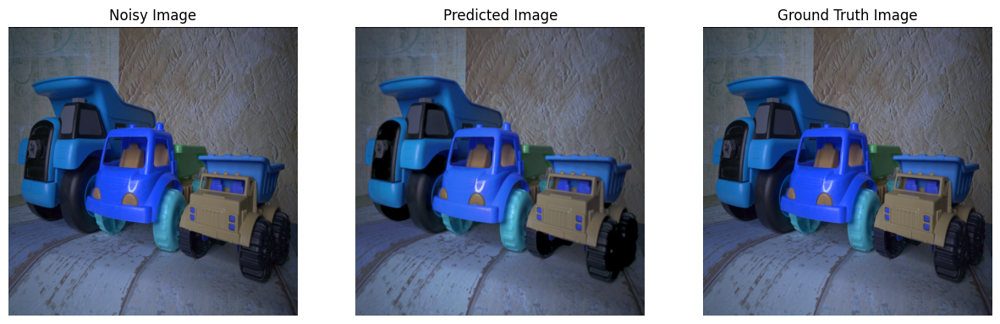

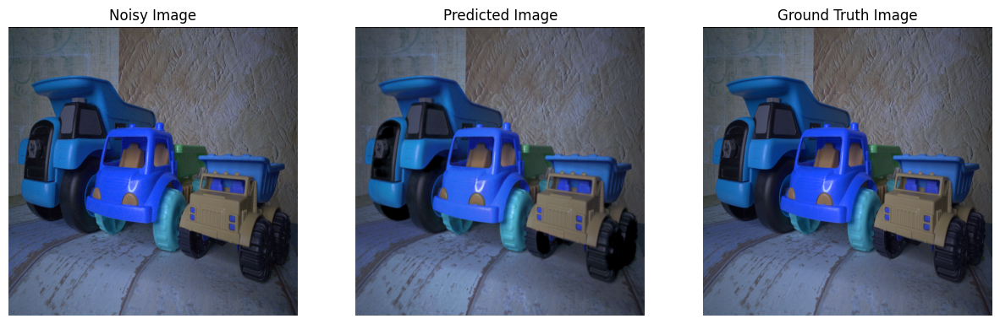

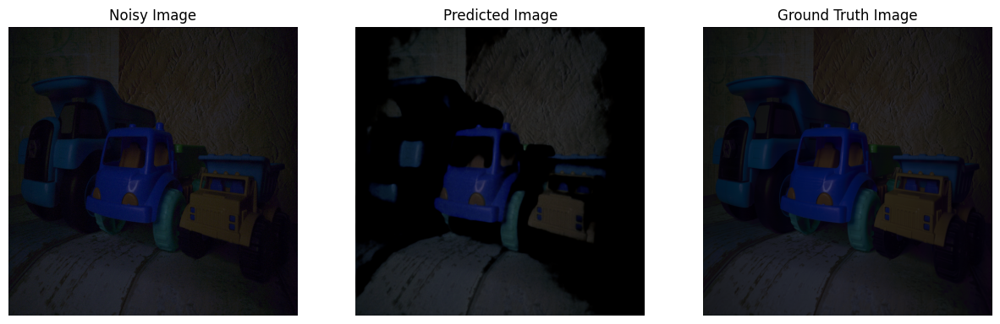

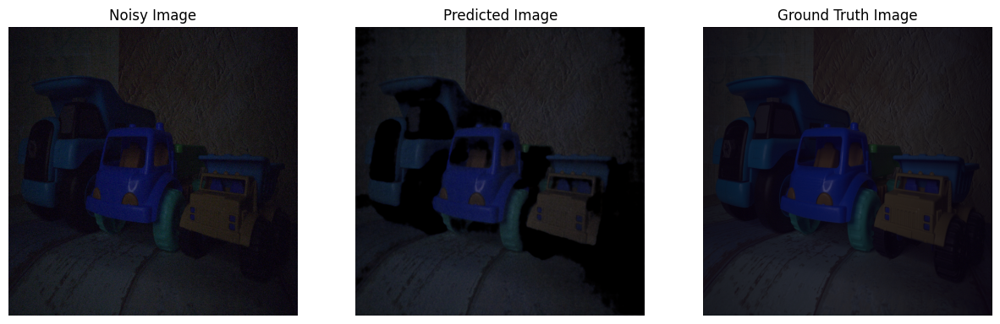

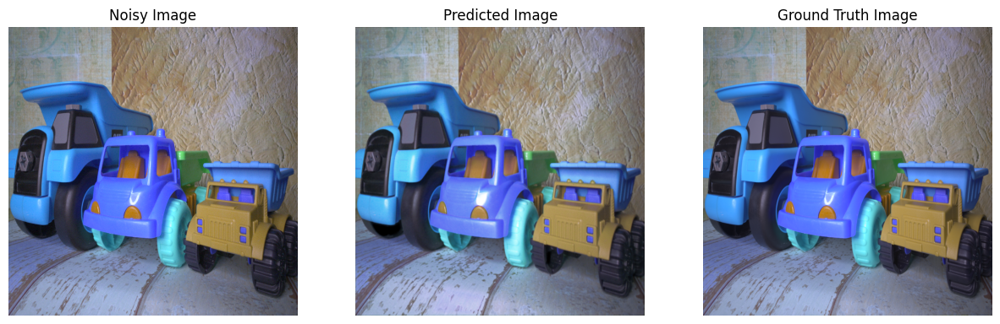

...

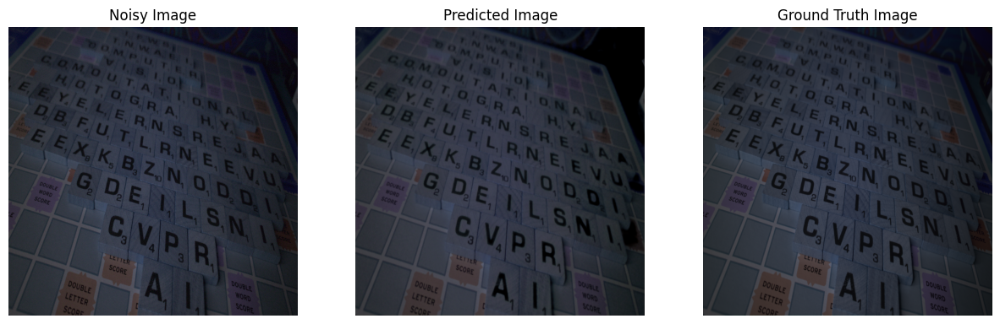

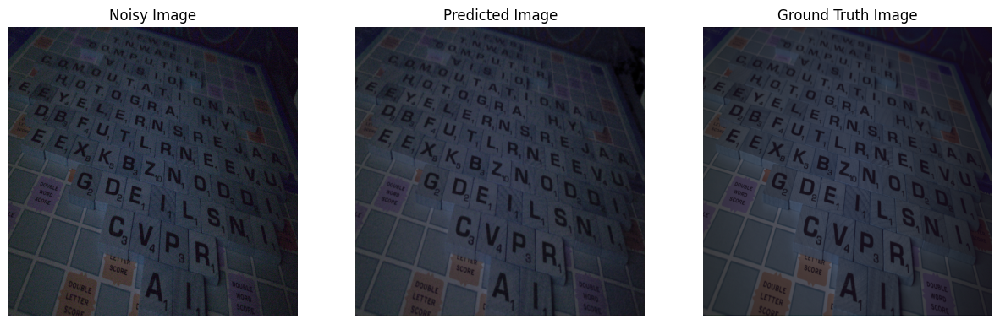

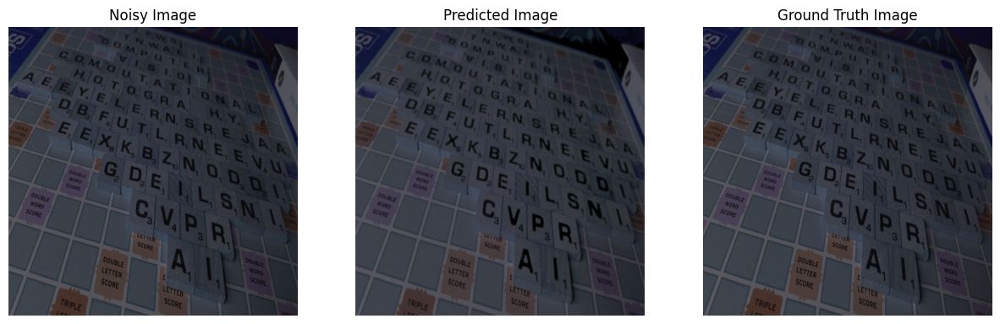

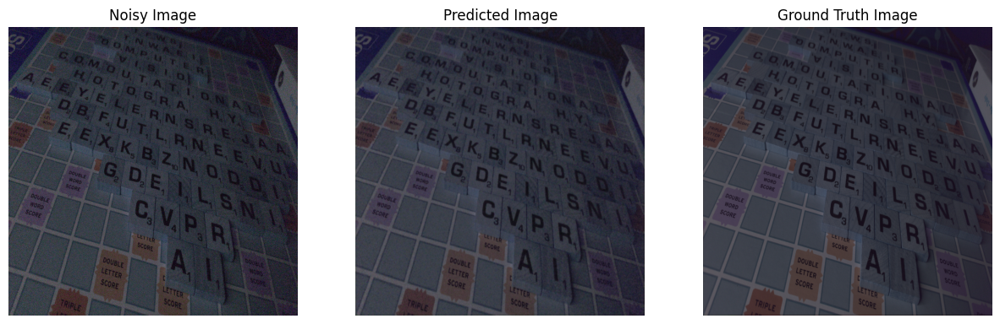

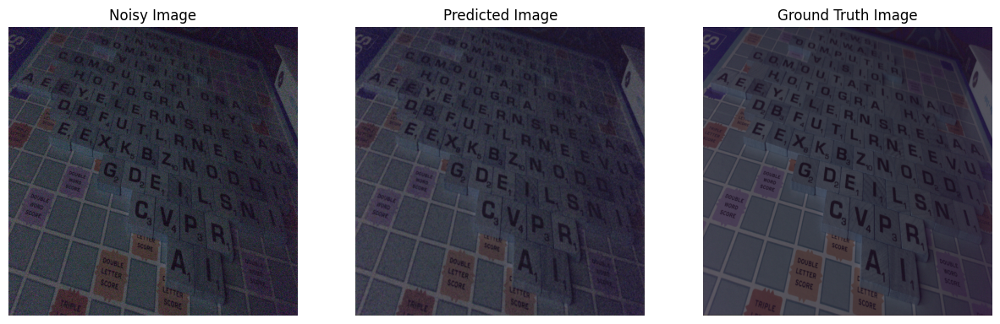

In [29]:
def infer(n_images=2):
    for i in range(100, 100 + n_images):
        x_img = np.expand_dims(noisy_img_array[i], axis=0)
        prediction = model.predict(x_img,verbose=0)
        y_img = gt_img_array[i]

        fig, ax = plt.subplots(ncols=3, figsize=(15,10))
        ax[0].imshow(x_img[0])
        ax[1].imshow(prediction[0])
        ax[2].imshow(y_img)
        ax[0].axis('off')
        ax[1].axis('off')
        ax[2].axis('off')
        ax[0].set_title("Noisy Image")
        ax[1].set_title("Predicted Image")
        ax[2].set_title("Ground Truth Image")
        plt.show()


# on test images
infer(n_images=20)

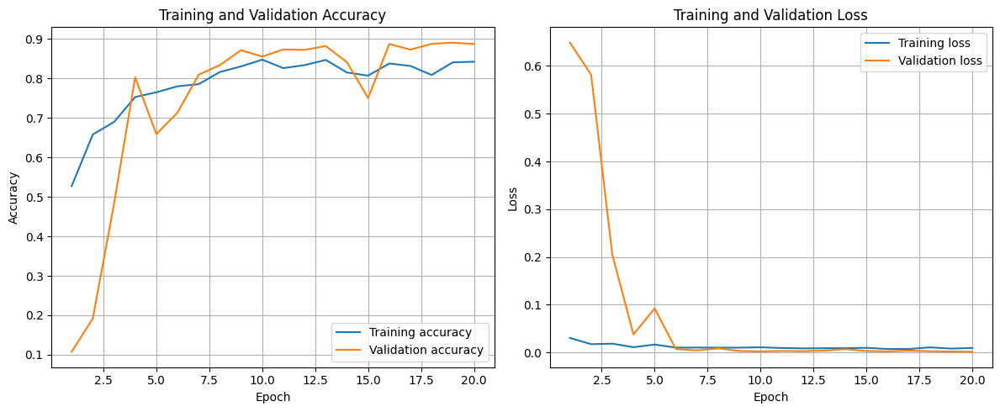

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.ylim([0, 1])
plt.legend(loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.ylim([0, 1])
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()